>*Ziuatdinov Islambek Sharapatdinovich.* **Group:** P4131

>**Alexnet method.**

In [1]:
import torch
import torchvision
from torchvision.io import read_image
from torchvision.models import alexnet, AlexNet_Weights
from torch.profiler import profile, record_function, ProfilerActivity

from google.colab import drive
drive.mount('/content/drive/')


Mounted at /content/drive/


In [2]:
imgs = []
for i in range(1,51):
  imgs.append(read_image(f"drive/MyDrive/LAB 3/datasets/img{i}.jpg").cuda())

text = ['gazelle', 'Alp', 'mud turtle', 'laptop', 'macaw', 'steam locomotive', 
        'leopard', 'white wolf', 'dial telephone', 'European gallinule', 'giant panda', 
        'acoustic guitar', 'umbrella', 'Greater Swiss Mountain dog', 'Siberian husky', 'tank', 
        'strawberry', 'stopwatch', 'birdhouse', 'cabbage butterfly', 'brown bear',
        'digital watch', 'Eskimo dog', 'coffee mug', 'American chameleon', 'horse cart', 'corn', 'sports car',
        'wolf spider', 'hummingbird', 'earthstar', 'Christmas stocking', 'ballon', 
        'reflex camera', 'toy poodle', 'platypus', 'container ship', 'tiger cat', 
        'aircraft carrier', 'passenger car', 'Arabian camel', 'tiger', 'cellular telephone', 'Indian elephant', 
        'wood rabbit', 'Polaroid camera', 'gorilla', 'koala', 'crane bird', 'leatherback turtle' ]

In [3]:
import time

n_top_predict = 5 #количество лучших предсказаний, которое мы будем выводить 


description = [] # список для описания фотографии
time_test = [] # список для времени

# Инициализация модели
weights = AlexNet_Weights.IMAGENET1K_V1 # веса объявляем (обученные на этом датасете –> IMAGENET1K_V1)
model = alexnet(weights=weights).cuda() # модель объявляем
model.eval() # используем модель без обучения (не меняем в ней веса)
top1_accuracy = 0
top5_accuracy = 0


# Инициализируем препроцессинг
preprocess = weights.transforms() 

for i in range(len(imgs)):
  
  # Используем препроцессинг для изображения
  batch = preprocess(imgs[i]).unsqueeze(0)

  # Предсказывем класс предета изображения с помощью модели
  start = time.time()
  prediction = model(batch).squeeze(0).softmax(0) 
  end = time.time()
  time_test.append(end-start)
  
  top_prediction = torch.topk(prediction.flatten(), n_top_predict).indices #тензор из 5 наиболее вероятных классов

  top_prediction_ind = [e.item() for e in top_prediction] # тензор превращаем в list (храняться индексы на классы)

  all_score = [prediction[e].item() for e in top_prediction_ind] # сохраняем вероятности

  category_names = [weights.meta["categories"][e] for e in top_prediction_ind] # список имён классов 

  array_descript = [f"{top_prediction_ind[e]} {category_names[e]}: {100 * all_score[e]:.1f}%" for e in range(n_top_predict)] # описание одного изображения
  description.append(" | ".join(array_descript)) # добавили в массив всех описаний

  # точность топ 1 и 5
  top1_accuracy += 1 if weights.meta["categories"][top_prediction_ind[0]] == text[i] else 0
  top5_accuracy += 1 if text[i] in [weights.meta["categories"][e] for e in top_prediction_ind] else 0

  memory_test = torch.cuda.max_memory_allocated() # сколько памяти сожрал
  torch.cuda.reset_peak_memory_stats() # ресетаем значение

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

In [4]:
memory_test / 1024**2

775.82275390625

In [5]:
time_test[:10]

[6.160218000411987,
 0.0014448165893554688,
 0.001047372817993164,
 0.0009133815765380859,
 0.0009772777557373047,
 0.0009884834289550781,
 0.0009806156158447266,
 0.001062631607055664,
 0.0010840892791748047,
 0.0010175704956054688]

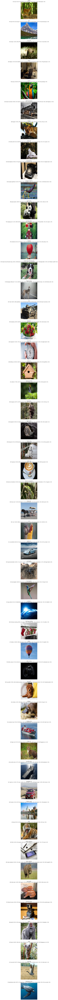

In [6]:
import os
import cv2
from matplotlib import pyplot as plt
import torchvision.transforms as T

transform = T.Resize((500,500))

if type(imgs[0]) == torch.Tensor:
  imgs = [i.cpu() for i in imgs]
  imgs = [transform(i).data.numpy().transpose((1,2,0)) for i in imgs]

pic_box = plt.figure(figsize=(400,300))
for i, pic in enumerate(imgs):
  pic=imgs[i]
  pic_box.add_subplot(50,1,i+1)
  plt.imshow(pic)
  plt.axis('off')
  plt.title(f'{text[i]}\n{description[i]}')
  
plt.show()